In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.read_csv("train.csv")
df

,uid,x0,x1,x2,x3,x4,x5,x6,x7,x8,...,x11,x12,x13,x14,x15,x16,x17,x18,x19,y
0,0,0,0,120.456020,0,85.590000,26.720000,1,0.000000,1,...,0,1,3,5,0,-1.000000,307,2,68.000000,1
1,1,1,7,118.760900,0,41.390000,9.050000,1,55.150000,1,...,0,1,2,7,2,-1.000000,33,1,29.000000,1
2,2,1,2,-1.000000,0,22.300000,24.040000,1,38.540000,2,...,0,1,4,13,3,-1.000000,19,2,21.000000,1
3,3,1,1,113.898770,0,63.206231,30.229573,1,81.690921,1,...,0,1,3,3,0,33.683173,39,13,63.407620,0
4,4,69,74,-1.000000,7,138.130000,9.820000,1,0.000000,22,...,121,1,10,160,7,84.710000,67,21,167.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,7995,1,1,110.786949,0,34.387165,32.563802,1,21.746282,1,...,0,1,10,0,1,36.941007,34,1,25.749831,0
7996,7996,0,0,-1.000000,0,43.490000,15.820000,1,5.880000,1,...,0,1,1,0,0,0.030000,24,2,44.000000,1
7997,7997,66,94,116.387910,0,94.790000,9.660000,113,47.910000,1,...,0,1,25,106,11,144.390000,410,1,70.000000,1
7998,7998,90,132,112.246500,0,197.010000,19.380000,1,82.170000,6,...,0,1,3,1,12,-1.000000,129,1,167.000000,1


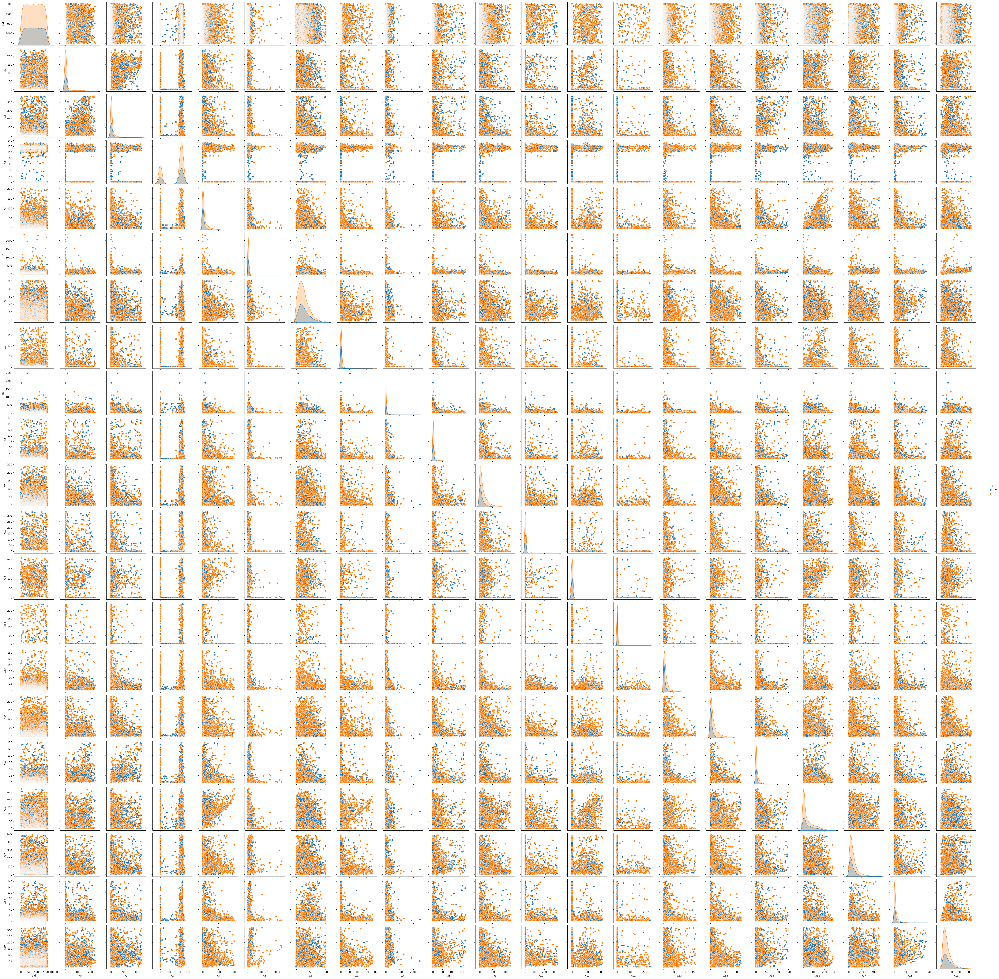

In [2]:
sns.pairplot(df, hue="y")

In [23]:
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz


tree_clf = DecisionTreeClassifier(max_depth=20)
# tree_clf.fit([row[1:-1] for row in df.values], [row[-1] for row in df.values])

# from sklearn.tree import DecisionTreeClassifier
# clf = DecisionTreeClassifier() #决策树分类器
# clf.fit(X_train, y_train) #拟合数据
# y_pred = clf.predict(X_test) #得出预测结果,从测试数据集
from sklearn import metrics
# p = metrics.precision_score(y_test, y_pred) #计算精度 P
# r = metrics.recall_score(y_test, y_pred) #计算召回率 R
# f1 = metrics.f1_score(y_test, y_pred) #计算 F1
kf = KFold(n_splits=8)
for train, test in kf.split(df):
    # print("k折划分：%s %s" % (train.shape, test.shape))
    tree_clf.fit([row[1:-1] for row in df.values[train]], [row[-1] for row in df.values[train]])
    y_pred = tree_clf.predict([row[1:-1] for row in df.values[test]])
    p = metrics.precision_score([row[-1] for row in df.values[test]], y_pred)
    r = metrics.recall_score([row[-1] for row in df.values[test]], y_pred)
    f1 = metrics.f1_score([row[-1] for row in df.values[test]], y_pred)
    print("p:%s r:%s f1:%s" % (p, r, f1))
    # break
# graphviz.Source(export_graphviz(
#     tree_clf,
#     out_file=None,
#     feature_names=df.columns[1:-1],
#     class_names=['bad', 'good'],
#     # rounded=True,
#     # filled=True,
#     special_characters=True))


p:0.7900146842878121 r:0.7620396600566572 f1:0.77577505407354
p:0.7892441860465116 r:0.768033946251768 f1:0.778494623655914
p:0.7798036465638148 r:0.7931526390870185 f1:0.7864214992927864
p:0.7897196261682243 r:0.7305475504322767 f1:0.7589820359281438
p:0.8066378066378066 r:0.7985714285714286 f1:0.8025843503230439
p:0.8072289156626506 r:0.7538677918424754 f1:0.7796363636363636
p:0.8008595988538681 r:0.7818181818181819 f1:0.7912243453644727
p:0.7776141384388807 r:0.775330396475771 f1:0.7764705882352941


In [6]:
results = tree_clf.predict(df.values[:, 1:-1])
tp, tn, fp, fn = 0, 0, 0, 0

for i in range(len(results)):
    # print(f"Predict: {results[i]}, Actual: {df.values[i][-1]}")
    match (results[i], df.values[i][-1]):
        case (0, 0):
            tn += 1
        case (0, 1):
            fn += 1
        case (1, 0):
            fp += 1
        case (1, 1):
            tp += 1

print(f"P: {tp/(tp+fp)}, R: {tp/(tp+fn)}, F1: {2*tp/(2*tp+fp+fn)}")


P: 0.9952924135433641, R: 0.9789848619768478, F1: 0.9870712874842881


In [16]:

# test_df = pd.read_csv("test_noLabel.csv")
# # test_result = pd.DataFrame(tree_clf.predict(test_df.values[:, 1:]), columns=["y"])
# test_result = pd.DataFrame()
# test_result["uid"] = test_df["uid"]
# test_result["y"] = tree_clf.predict(test_df.values[:, 1:]).astype(int)
# test_result.to_csv("test_result.csv", index=False)